# Combining zip files

In [ ]:
import os
import numpy as np
from zipfile import ZipFile   
from time import time     
from PIL import Image 
import cv2

In [ ]:
ZIP_FILE_PATH = "/content/zip2/fgbganddepth_part2.zip"
OUT_DIR = '/content/zip2'

In [ ]:
def extractFile(file_name,path):
  t1 = time()
  with ZipFile(file_name, 'r') as zip:
      # printing all the contents of the zip file
      zip.printdir()
    
      # extracting all the files
      print('Extracting all the files now...')
      zip.extractall(path)
      print('Done!',f"it took {time()-t1} seconds...")

In [ ]:
def copy_to_zip_file(out,path):
  for img in os.listdir(path+"/images"):
    out.write(path+"/images/"+img, f'output/images/{img}')
  for img in os.listdir(path+"/masks"):
    out.write(path+"/masks/"+img, f'output/masks/{img}')
  for img in os.listdir(path+"/depth"):
    out.write(path+"/depth/"+img, f'output/depth/{img}')
  out.close()

In [ ]:
extractFile(ZIP_FILE_PATH, OUT_DIR)

Done! it took 183.74956512451172 seconds...


In [ ]:
!cp /content/fgbganddepth_part1.zip /content/drive/MyDrive/QuMaDe2/output

# Data Statistics

In [ ]:
from zipfile import ZipFile
with ZipFile('/content/fgbganddepth_part1.zip', mode='r') as input:
  input.extractall('.')

In [ ]:
print(len(os.listdir("/content/output/images")))
print(len(os.listdir("/content/output/masks")))

400000
400000


In [ ]:
from tqdm import tqdm_notebook
import numpy as np
import cv2

def findMeanStd(inpath):
  n=0
  s = np.zeros(3)
  sq = np.zeros(3)

  imagelist = list(filter(lambda x: x.endswith('jpg'), os.listdir(inpath)))

  for data in tqdm_notebook(imagelist):
    bgimg = os.path.join(inpath, data)
    image = cv2.imread(bgimg)
    x = np.array(image)/255
    s += x.sum(axis = (0, 1))
    sq += np.sum(np.square(x), axis = (0,1))
    n += x.shape[0]*x.shape[1]

  mu = s/n
  std = np.sqrt((sq/n - np.square(mu)))
  return (len(imagelist), mu, std)

In [ ]:
def displaygrid(inpath, imlist, imtype='jpg'):
  images = [Image.open(os.path.join(inpath, x)) for x in imlist]
  widths, heights = zip(*(i.size for i in images))
  
  total_width = sum(widths)
  max_height = max(heights)

  if (imtype=='jpg'):
    new_im = Image.new('RGB', (total_width, max_height))
  else:
    new_im = Image.new('RGBA', (total_width, max_height))

  offset = 0
  for im in images:
    new_im.paste(im, (offset, 0))
    offset += im.size[0]
    
  return new_im

## Background Images

In [ ]:
print("Statistics of image data")
total, mean, std = findMeanStd('/content/drive/MyDrive/QuMaDe2/bgImages')
print("Total No.of images : ", total)
print("Mean : ", mean)
print("Standard Deviaiton : ", std)

Statistics of image data


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  if sys.path[0] == '':


  0%|          | 0/100 [00:00<?, ?it/s]

Total No.of images :  100
Mean :  [0.42878883 0.42664049 0.39733409]
Standard Deviaiton :  [0.29921279 0.26882966 0.26442518]


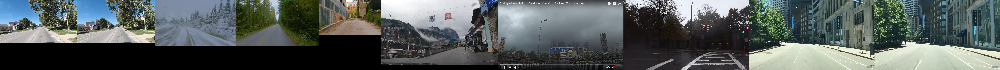

In [ ]:
imglist = list(filter(lambda x: x.endswith('jpg'), os.listdir('/content/drive/MyDrive/QuMaDe2/bgImages')))
imglist.sort()
im = displaygrid('/content/drive/MyDrive/QuMaDe2/bgImages', imglist[30:40])
im.save('bgimages.jpg')
display(im)

## Foreground Images

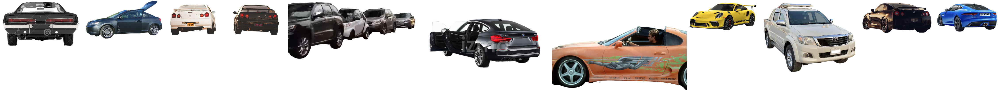

In [ ]:
imglist = list(filter(lambda x: x.endswith('png'), os.listdir('/content/drive/MyDrive/QuMaDe2/fgImages')))
imglist.sort()
im = displaygrid('/content/drive/MyDrive/QuMaDe2/fgImages', imglist[10:20], imtype='png')
im.save('foreground.png')
display(im)

## Masks

In [ ]:
imglist = list(filter(lambda x: x.endswith('jpg'), os.listdir('/content/drive/MyDrive/QuMaDe2/masks')))
imglist.sort()
im = displaygrid('/content/drive/MyDrive/QuMaDe2/masks', imglist[10:20])
im.save('masks.jpg')
display(im)

## Bg images after overlayiong fg Images

In [ ]:
print("Statistics of image data")
total, mean, std = findMeanStd('output/images')
print("Total No.of images : ", total)
print("Mean : ", mean)
print("Standard Deviaiton : ", std)

In [ ]:
imglist = list(filter(lambda x: x.endswith('jpg'), os.listdir('output/images')))
imglist.sort()
im = displaygrid('output/images', imglist[:10])
im.save('fgbggrid.jpg')
display(im)